# CycleGAN in Keras

This project is my school homework at "intro to deep learning" class by CU Bouder MS-DS on cousera.

## Abstraction

This notebooks goal is to make GANs to create Monet-style images from photos. The GAN will generate 7000 to 10000 Monet-style image with trained generator and discriminator models, 2 generators and 2 discriminators each. The evaluation for the model is MiFID, which calculate distance between original image and generate image. We use generator and discminator loss as metric while training the models as well. The challenge would be tuning hyper parameters since small param changes impact a lot to the GANs model.

Out choise of GANs is CycleGAN because it is good candidate for unpaird image-to-image transformation task, like this competition. Another approach, like neaural transfer, could be possible but we focus only on CycleGAN here.

The datasets are in 2 formats, jpeg and tfrecord. We use tfrecord in this notebook. The model will assume to be trained on TPU, not on GPU. The original competition is hosted in kaggle, https://www.kaggle.com/competitions/gan-getting-started/overview. You can get the same dataset as we use here at the competition page.

The notebook workflow:
1. Load necessary libraries
2. Get the training/test dataset
3. EDA
4. Build and evaluate model
5. Make prediction for submitting it to competition
6. Discussion/conclusion

**keywords**: TPU, Keras, CycleGAN

## Install libraries

We make sure if notebook is running on TPU

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import time

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

import matplotlib.pyplot as plt
from IPython.display import clear_output


try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print(tpu.master())
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
except:
    tpu = None
    strategy = tf.distribute.get_strategy()
print("Replica: ", strategy.num_replicas_in_sync)

# if tpu:
#   policyConfig = 'mixed_bfloat16'
# else: 
#   policyConfig = 'mixed_float16'

# tf.keras.mixed_precision.set_global_policy(policyConfig)
AUTOTUNE = tf.data.experimental.AUTOTUNE

D0420 23:22:01.728096541      13 config.cc:119]                        gRPC EXPERIMENT tcp_frame_size_tuning               OFF (default:OFF)
D0420 23:22:01.728135392      13 config.cc:119]                        gRPC EXPERIMENT tcp_rcv_lowat                       OFF (default:OFF)
D0420 23:22:01.728140198      13 config.cc:119]                        gRPC EXPERIMENT peer_state_based_framing            OFF (default:OFF)
D0420 23:22:01.728143957      13 config.cc:119]                        gRPC EXPERIMENT flow_control_fixes                  ON  (default:ON)
D0420 23:22:01.728147414      13 config.cc:119]                        gRPC EXPERIMENT memory_pressure_controller          OFF (default:OFF)
D0420 23:22:01.728151124      13 config.cc:119]                        gRPC EXPERIMENT unconstrained_max_quota_buffer_size OFF (default:OFF)
D0420 23:22:01.728154519      13 config.cc:119]                        gRPC EXPERIMENT new_hpack_huffman_decoder           ON  (default:ON)
D0420 23:22:01.


INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.


INFO:tensorflow:Initializing the TPU system: local


INFO:tensorflow:Finished initializing TPU system.


INFO:tensorflow:Found TPU system:


INFO:tensorflow:Found TPU system:


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


Replica:  8


## Load training/test dataset

We use tfrecord instead of jpeg file, but both contains the same data. The monet are `300` entries, while photo are `7038` entries. We will need to check if this imbalancing dataset could affect our model's performance later. If so, gettiing additinal monet image from other sources would be necessary to fix that.

In [2]:
MONET_F = tf.io.gfile.glob(str("/kaggle/input/gan-getting-started/monet_tfrec/*.tfrec"))
print("Monet files: ", len(MONET_F))

PHOTO_F = tf.io.gfile.glob(str("/kaggle/input/gan-getting-started/photo_tfrec/*.tfrec"))
print("Photo files: ", len(PHOTO_F))

Monet files:  5
Photo files:  20


In [3]:
print("Monet Image Number: ", len(os.listdir("/kaggle/input/gan-getting-started/monet_jpg")))
print("Photo Image Number: ", len(os.listdir("/kaggle/input/gan-getting-started/photo_jpg")))

Monet Image Number:  300


Photo Image Number:  7038


We get all images, size `256` height and `256` width. For training dataset, we apply 3 augumentations for model's generality. The augumentations are resized to `[286, 86]`, random cropping to original image size `[256, 256]`, and them random mirroring flip. Last process is nomalization to convert image into `[-1, 1]` range. For test sets, we apply same preprocess withou any augumentations. One key point is our batch size is `1` since this task is unpaird image-to-image transformation.

In [4]:
IMG_SIZE = [256, 256]
CHANNEL = 3

def preprocess_train(img):
    img = tf.image.decode_jpeg(img, channels=CHANNEL)
    # Augumentations
    img = tf.image.resize(img, [286, 286], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    img = tf.image.random_crop(img, size=[*IMG_SIZE, 3])
    if tf.random.uniform(()) < 0.4:
        img = tf.image.random_flip_left_right(img)
    if tf.random.uniform(()) < 0.2:
        img = tf.image.random_flip_up_down(img)
        img = tf.image.random_brightness(img, 0.2)
        img = tf.image.random_contrast(img, 0.5, 2.0)
        img = tf.image.random_saturation(img, 0.75, 1.25)
    
    # Normalize image to [-1, 1]
    return (tf.cast(img, tf.float32) / 127.5) - 1
    
def preprocess_test(img):
    img = tf.image.decode_jpeg(img, channels=CHANNEL)
    return (tf.cast(img, tf.float32) / 127.5) - 1
    
def read_tfrecord_train(example):
    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string),
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    
    return preprocess_train(example["image"])

def read_tfrecord_test(example):
    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string),
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    
    return preprocess_test(example["image"])

# For training set
monet_train_ds = tf.data.TFRecordDataset(MONET_F).map(read_tfrecord_train, num_parallel_calls=AUTOTUNE).batch(1)
photo_train_ds = tf.data.TFRecordDataset(PHOTO_F).map(read_tfrecord_train, num_parallel_calls=AUTOTUNE).batch(1)
# For test set
monet_test_ds = tf.data.TFRecordDataset(MONET_F).map(read_tfrecord_test, num_parallel_calls=AUTOTUNE).batch(1)
photo_test_ds = tf.data.TFRecordDataset(PHOTO_F).map(read_tfrecord_test, num_parallel_calls=AUTOTUNE).batch(1)

Let't see each images visually. In the below plot, we can see 6 each monent and photo images from training sets. Some images seem cropped or flip horizontally as expected.

Monet Images


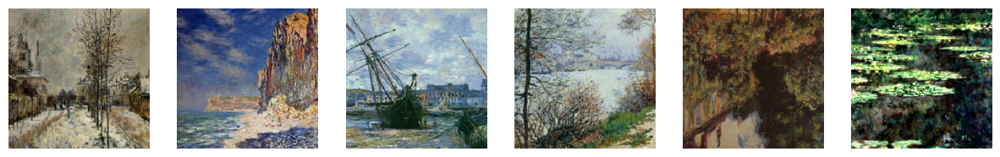


Photo Images


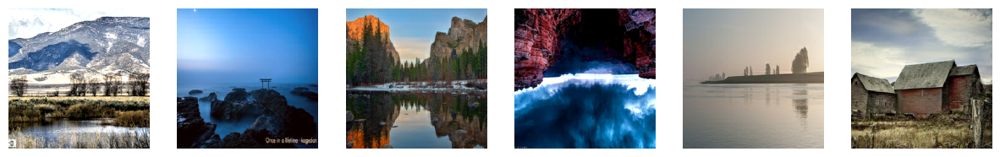

In [5]:
example_monet_train = next(iter(monet_train_ds))
example_photo_train = next(iter(photo_train_ds))

plt.figure(figsize=(15, 15))
i = 0
print("Monet Images")
for img in monet_train_ds.take(6):
    plt.subplot(1, 6, i+1)
    plt.imshow(img[0] * 0.5 + 0.5)
    plt.axis("off")
    i += 1
plt.show()

plt.figure(figsize=(15, 15))
i = 0
print("\nPhoto Images")
for img in photo_train_ds.take(6):
    plt.subplot(1, 6, i+1)
    plt.imshow(img[0] * 0.5 + 0.5)
    plt.axis("off")
    i += 1
plt.show()

## Build and Evaluate model

We buid CycleGAN in a (unet)[https://paperswithcode.com/method/u-net] arhitecture. The original paper use Resnet, but we apply U-Net for implementation and tuning simplicity.Also, you might notice that we use instancenorm layer instead of usual batchnorm. Why? Its becaues our batch size is just `1`.

Ok, then let me expain how CycleGAN works. We have two generators(G, and F) and two discriminators(X, and Y).

* `G` generator transform Monet(X) to Photo(Y) image
* `F` generator transfrom Photo(Y) to Monet(X) image
* `D_X` discriminator detect Real Monet(X) and generated Monet(X) by `F`
* `D_Y` discriminator detect Real Photo(Y) and generated Photo(Y) by `G`

We train those 4 models simultainously to get the better generator. To put it simple, generator make faked images, while discriminator detect facked and real images. Those adversal relationship will help model to learn the dataset well.

The image below shows its releationships between models, which is cited from [tensorflow cyclegan tutorial](https://www.tensorflow.org/tutorials/generative/cyclegan)

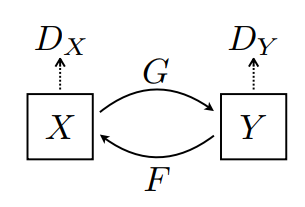

The following model's code is based on tensorflow examples repo, https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py

In [6]:
# The code is based on tensorflow examples repo,
# https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py
# 
# Copyright 2019 The TensorFlow Authors. All Rights Reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");

class InstanceNormalization(tf.keras.layers.Layer):
    def __init__(self, epsilon=1e-5):
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon

    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)

        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)

    def call(self, x):
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

    
def downsample(filters, size, apply_norm=True):  
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2D(filters, size, strides=2, padding="same",
                                kernel_initializer=initializer, use_bias=False)
    )
    if apply_norm:
        result.add(InstanceNormalization())
    result.add(tf.keras.layers.LeakyReLU())

    return result

def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
          tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding="same",
                                 kernel_initializer=initializer, use_bias=False)
    )
    result.add(InstanceNormalization())
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    result.add(tf.keras.layers.ReLU())

    return result

Here is the unet architecture that we used in generator implementation. The image is cited from [medium article](https://medium.com/analytics-vidhya/what-is-unet-157314c87634)

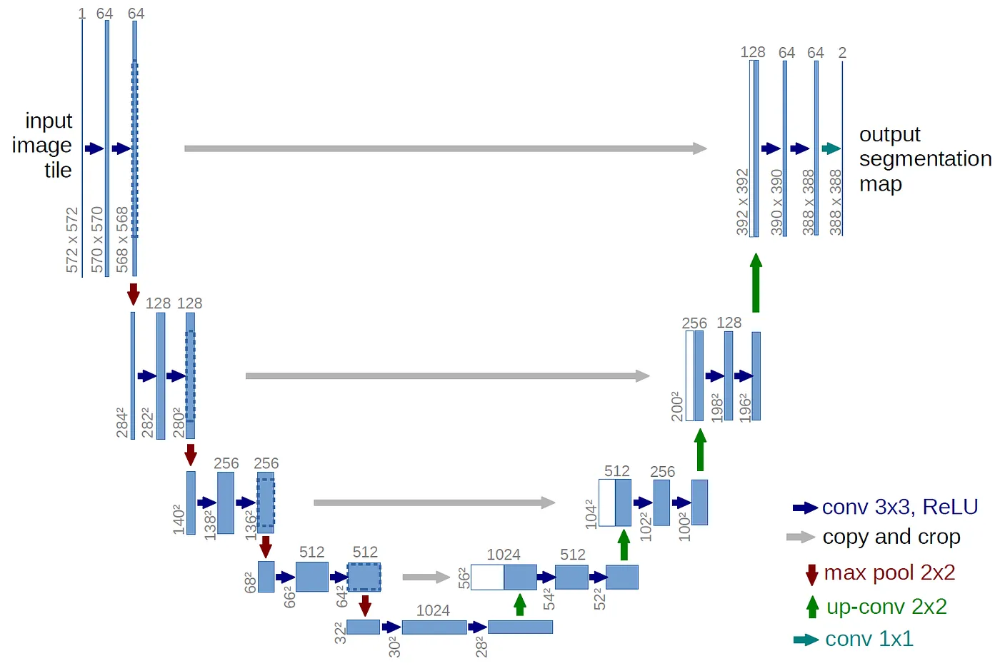


The left part of "U" is encoder and right part is decoder. The encoder works as feature extraction, while decoder is segmentation mask generator. In our case, Photo and Monet image is fed to encoder to get each features, and then decoder mask each images segmentations. One interesting point of thie architecture is using skip network between encoder and decoder. The code for skip connection below is `x = concat([x, skip])` in upsampling part. Depth layers often loss the information by its depth. The skip connection, however, transfer the early layers feature to later layer so that lost informatin can be passed thorughout network.

In [7]:
# The code is based on tensorflow examples repo,
# https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py
# 
# Copyright 2019 The TensorFlow Authors. All Rights Reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");

def Generator(output_c):
    down_stack = [
        downsample(64, 4, apply_norm=False), # (batch_size, 128, 128, 64)
        downsample(128, 4),  # (batch_size, 64, 64, 128)
        downsample(256, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
        upsample(512, 4),  # (batch_size, 16, 16, 1024)
        upsample(256, 4),  # (batch_size, 32, 32, 512)
        upsample(128, 4),  # (batch_size, 64, 64, 256)
        upsample(64, 4),   # (batch_size, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    concat = tf.keras.layers.Concatenate() 

    inputs = tf.keras.layers.Input(shape=[*IMG_SIZE, 3])
    x = inputs
    # Downsampling
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])
    # Upsampling
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])
    outputs = tf.keras.layers.Conv2DTranspose(output_c, 4,
                                        strides=2,
                                        padding="same",
                                        kernel_initializer=initializer,
                                        activation="tanh")(x)

    return tf.keras.Model(inputs=inputs, outputs=outputs)

def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    
    inputs = tf.keras.layers.Input(shape=[*IMG_SIZE, 3], name="input_image")
    x = inputs
    x = downsample(64, 4, apply_norm=False)(x)   # (batch_size, 128, 128, 64)
    x = downsample(128, 4)(x)  # (batch_size, 64, 64, 128)
    x = downsample(256, 4)(x)  # (batch_size, 32, 32, 256)

    x = tf.keras.layers.ZeroPadding2D()(x) # (batch_size, 34, 34, 256)
    x = tf.keras.layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(x) # (batch_size, 31, 31, 512)
    x = InstanceNormalization()(x)
    x = tf.keras.layers.LeakyReLU()(x)
    x = tf.keras.layers.ZeroPadding2D()(x)  # (batch_size, 33, 33, 512)
    outputs = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(x)

    return tf.keras.Model(inputs=inputs, outputs=outputs)

In [8]:
# For generator
gen_g = Generator(CHANNEL)
gen_f = Generator(CHANNEL)

# For discriminator
disc_x = Discriminator()
disc_y = Discriminator()

In [9]:
tf.keras.utils.plot_model(gen_g, show_shapes=True, dpi=64)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [10]:
tf.keras.utils.plot_model(disc_x, show_shapes=True, dpi=64)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In the below plots, we see what output each generator and discriminator generates images. The generated image seem just noise one without training the models.

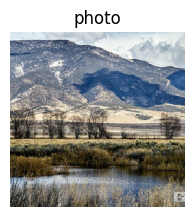

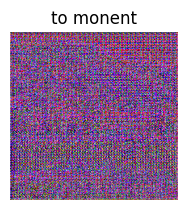

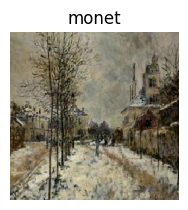

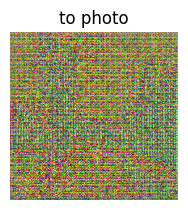

In [11]:
to_monet = gen_g(example_photo_train)
to_photo = gen_f(example_monet_train)
plt.figure(figsize=(5, 5))
contrast = 8

imgs = [example_photo_train, to_monet, example_monet_train, to_photo]
title = ["photo", "to monent", "monet", "to photo"]

for i in range(len(imgs)):
    plt.subplot(2, 2, i+1)
    plt.title(title[i])
    if i % 2 == 0:
        plt.imshow(imgs[i][0] * 0.5 + 0.5)
    else:
        plt.imshow(imgs[i][0] * 0.5 * contrast + 0.5)
    plt.axis("off")
    plt.show()
    

Following code calculate each model's loss.

* `disc_loss` get (real images loss + fake image loss) / 2
* `gen_loss` get fake image loss
* `calc_cycle_loss` get generated, and generated image and real image's mean absolue error. For instance, Photo_generator(Monet_generator(photo)) and original photo image.
* `identity_loss` get output and given desired output image as input 's mean absolute error. For instance, Photo_generator(photo) and original photo image

In [12]:
LAMBDA = 10
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True, label_smoothing=0.2)

def disc_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    gen_loss = loss_obj(tf.zeros_like(generated), generated)
    
    return (real_loss + gen_loss) * 0.5

def gen_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

def calc_cycle_loss(real, cycled):
    return LAMBDA * tf.reduce_mean(tf.abs(real - cycled))

def identity_loss(real, same):
    return LAMBDA * 0.5 * tf.reduce_mean(tf.abs(real - same))

We utilize consine annealing to reduce learning rate as train epoch increases.

In [13]:
from tensorflow.keras.optimizers.schedules import CosineDecay

INIT_LR = 2e-4
NUM_ITERATIONS = 250000

lr_schedule_g = CosineDecay(initial_learning_rate=INIT_LR, decay_steps=NUM_ITERATIONS)
lr_schedule_f = CosineDecay(initial_learning_rate=INIT_LR, decay_steps=NUM_ITERATIONS)
lr_schedule_x = CosineDecay(initial_learning_rate=INIT_LR, decay_steps=NUM_ITERATIONS)
lr_schedule_y = CosineDecay(initial_learning_rate=INIT_LR, decay_steps=NUM_ITERATIONS)

gen_g_opt = tf.keras.optimizers.Adam(lr_schedule_g, beta_1=0.5)
gen_f_opt = tf.keras.optimizers.Adam(lr_schedule_f, beta_1=0.5)
disc_x_opt = tf.keras.optimizers.Adam(lr_schedule_x, beta_1=0.5)
disc_y_opt = tf.keras.optimizers.Adam(lr_schedule_y, beta_1=0.5)

In [14]:
check_path = "./checkpoints/train"

ckpt = tf.train.Checkpoint(gen_g=gen_g, gen_f=gen_f, disc_x=disc_x, disc_y=disc_y,
                          gen_g_opt=gen_g_opt, gen_f_opt=gen_f_opt, disc_x_opt=disc_x_opt, disc_y_opt=disc_y_opt)
ckpt_manager = tf.train.CheckpointManager(ckpt, check_path, max_to_keep=5)

if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print("Load latest checkpoint")

The training function, `train_step`, seems a bit complet at first glance, but it works as usual deep learning trainig step.

Training steps are as follows:

1. Generator learns Monet and Photo images
2. Discriminator learns Monet and Photo to both real and generator's fake images
3. Calculate each model's , generator and discriminator, loss.
4. Get gradients of both model
5. Update weights based on latest gradients

In [15]:
def generate_images(model, test_input):
    pred = model(test_input)
    
    plt.figure(figsize=(12, 12))
    display_list = [test_input[0], pred[0]]
    title = ["Input", "Predict"]
    
    for i in range(2):
        plt.subplot(1, 2, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis("off")
    plt.show()

    
# this anotation compiles function
@tf.function
def train_step(real_x, real_y):
    # gen_g translates x -> y
    # gen_f translates y -> x
    # disc_x evaluate (x, fake_x)
    # disc_y evaluate (y, fake_y)
    with tf.GradientTape(persistent=True) as tape:
        fake_y = gen_g(real_x, training=True)
        cycled_x = gen_f(fake_y, training=True)
        
        fake_x = gen_f(real_y, training=True)
        cycled_y = gen_g(fake_x, training=True)
        
        # For identity loss
        same_x = gen_f(real_x, training=True)
        same_y = gen_g(real_y, training=True)
        
        disc_real_x = disc_x(real_x, training=True)
        disc_real_y = disc_y(real_y, training=True)
        disc_fake_x = disc_x(fake_x, training=True)
        disc_fake_y = disc_y(fake_y, training=True)
        
        # Loss for generators
        gen_g_loss = gen_loss(disc_fake_y)
        gen_f_loss = gen_loss(disc_fake_x)
        # Cycled loss
        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)
        # Total generator loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)
        # Loss discriminator
        disc_x_loss = disc_loss(disc_real_x, disc_fake_x)
        disc_y_loss = disc_loss(disc_real_y, disc_fake_y)
    
    # Get gradients for both generator and discriminator
    gen_g_grads = tape.gradient(total_gen_g_loss, gen_g.trainable_variables)
    gen_f_grads = tape.gradient(total_gen_f_loss, gen_f.trainable_variables)
    disc_x_grads = tape.gradient(disc_x_loss, disc_x.trainable_variables)
    disc_y_grads = tape.gradient(disc_y_loss, disc_y.trainable_variables)
    
    # Update weights by feeding gradients
    gen_g_opt.apply_gradients(zip(gen_g_grads, gen_g.trainable_variables))
    gen_f_opt.apply_gradients(zip(gen_f_grads, gen_f.trainable_variables))
    disc_x_opt.apply_gradients(zip(disc_x_grads, disc_x.trainable_variables))
    disc_y_opt.apply_gradients(zip(disc_y_grads, disc_y.trainable_variables))
        

At each epoch, we see monet generator performance by its input and prediction images. We set `20` epochs　Then, why we set just 20? Its all for submitting to the competition. The current kaggle kernel enable the notebook to run only within 2 hours. Thus, we need to make our training time in that range. However, in our experiment, we find that more training epoch increase, the more better model predicts. 

One challenge when training GANs is assessing model's loss if it indicate training goes well or not. Just seeing its loss value of both discriminator and generator can't make us understand training performance, so we decided to see generator's prediciotn directly. That visualization is the most obioust indicator while training the model. Another challenge is changing hyper parameter influence a lot to the model's performance, but we don't have way to get the better model before end of training. We just manually tune our hyper parameter, but it could be better.

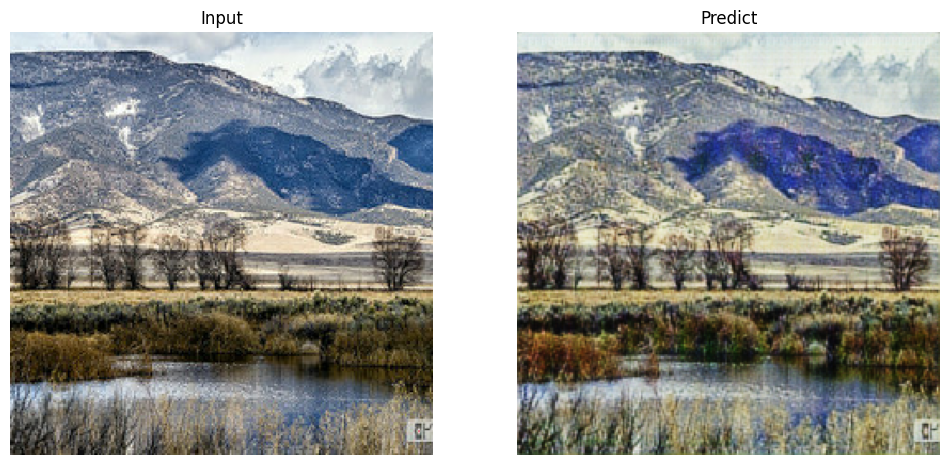

Saving checkpoint for epoch 20 at ./checkpoints/train/ckpt-4
Time taken for epoch 20 is 257.8961455821991 sec 



In [16]:
EPOCHS = 20

for epoch in range(EPOCHS):
    start = time.time()
    
    n = 0
    for image_x, image_y in tf.data.Dataset.zip((photo_train_ds, monet_train_ds)):
        train_step(image_x, image_y)
        if n % 10 == 0:
            print(".", end="")
        n += 1
    
    clear_output(wait=True)
    
    generate_images(gen_g, example_photo_train)
    
    if (epoch + 1) % 5 == 0:
        
        ckpt_save_path = ckpt_manager.save()
        print("Saving checkpoint for epoch {} at {}".format(epoch+1, ckpt_save_path))
    
    print("Time taken for epoch {} is {} sec \n".format(epoch+1, time.time() - start))

## Make prediction for submission

After finish of training, we would see monet generators prediction from photo images. The followiing plots shows that from test dataset. The testset are almost the same data as training, but it are't applied data augumentation.

Whta we found through predictionse:
* Many blue sky and sea in images are ambiguous
* Model seem not train well on blue color 
* If image has not blue color, the model can distinguish its different color channel and predicts better images.

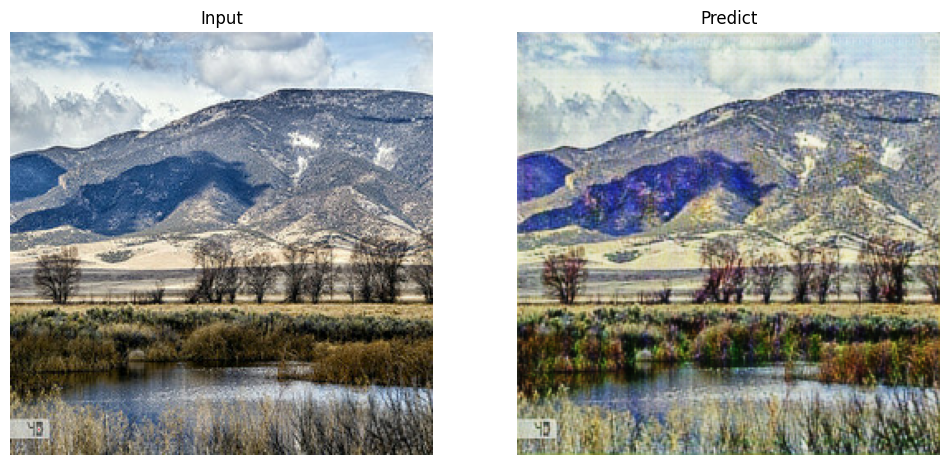

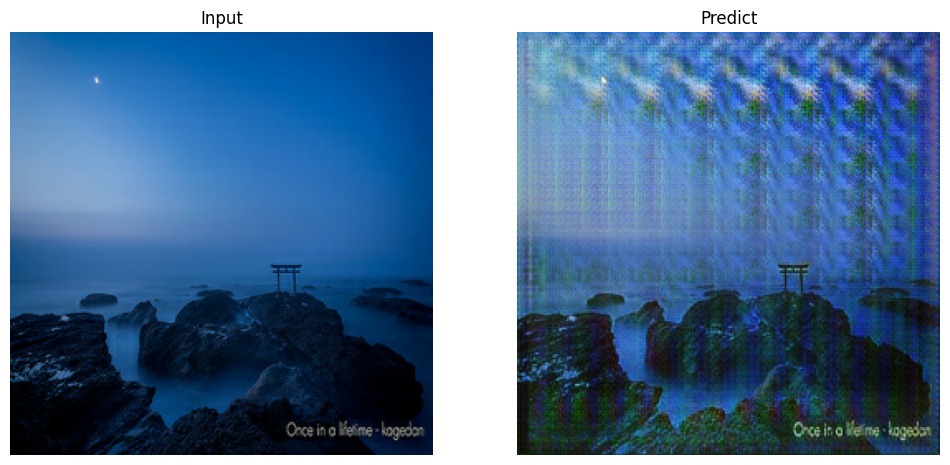

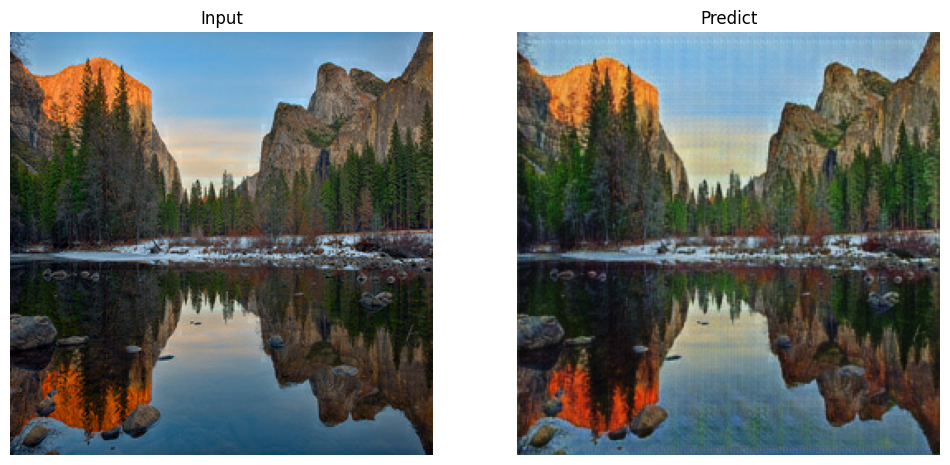

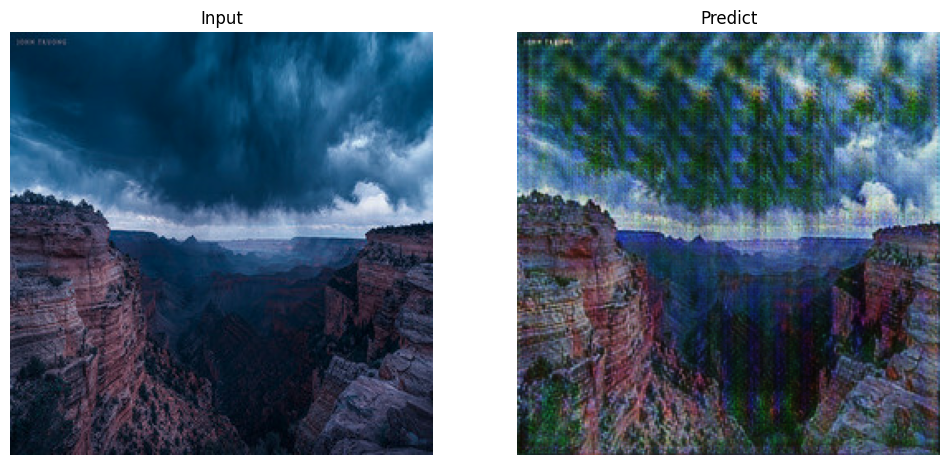

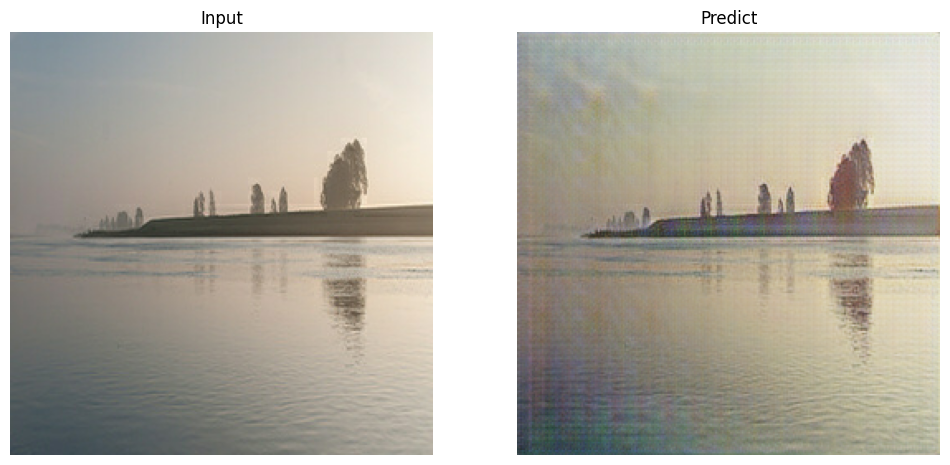

...

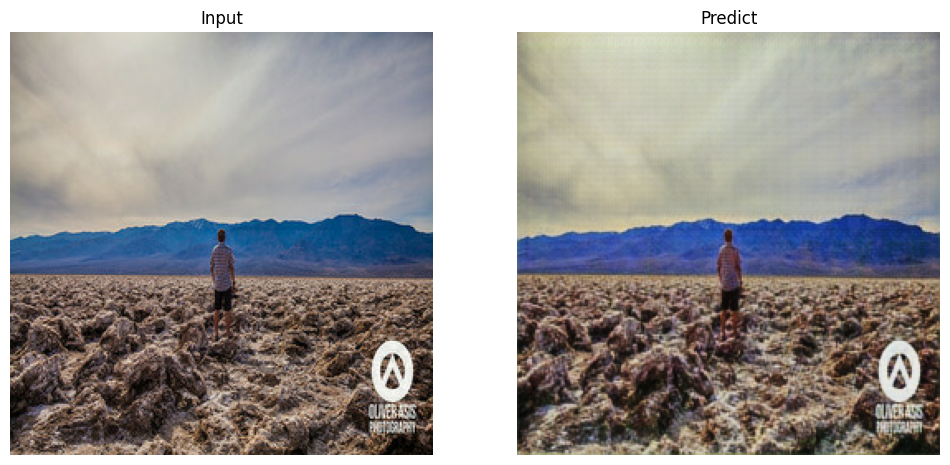

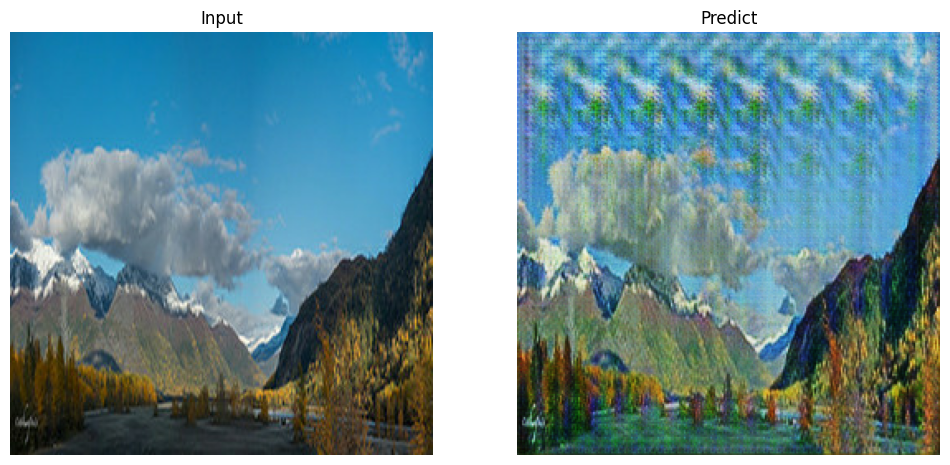

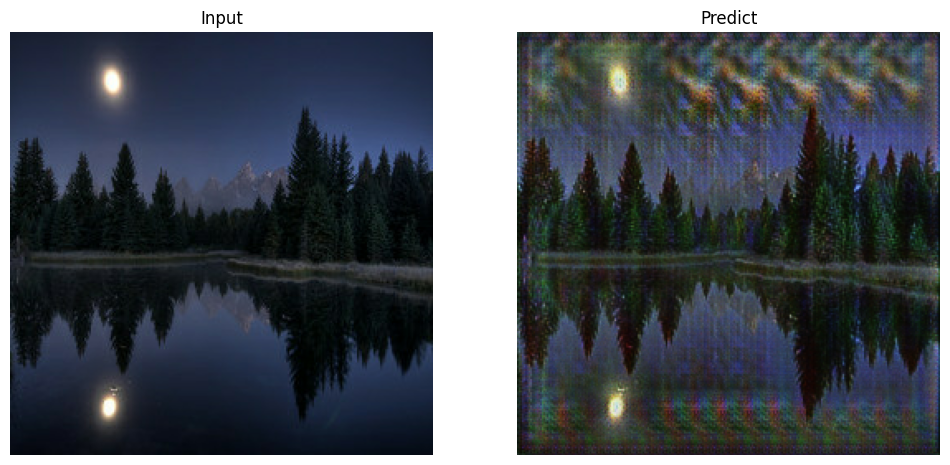

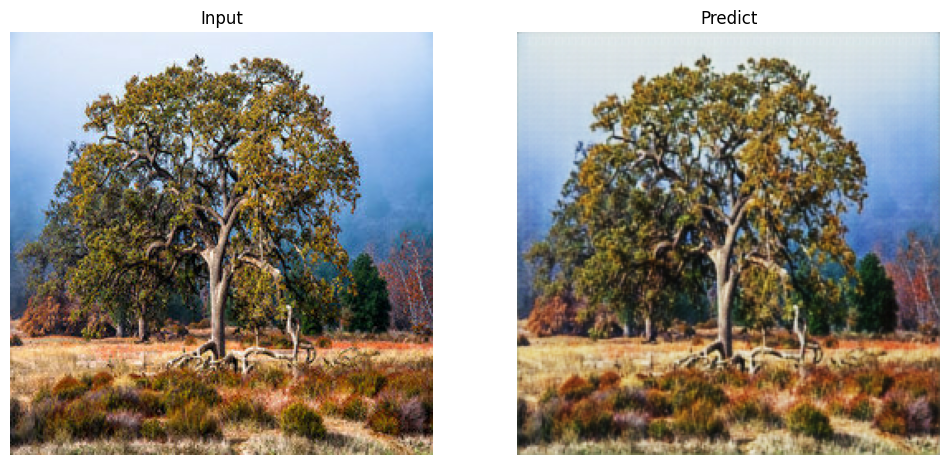

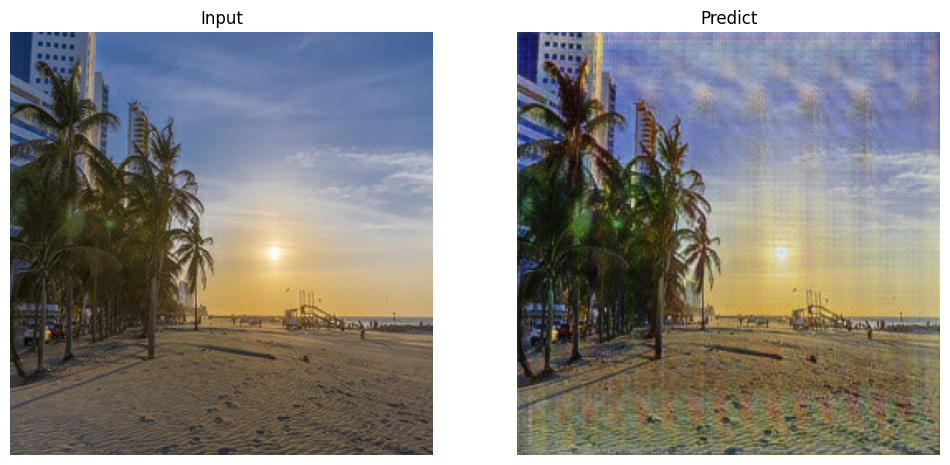

In [17]:
for inp in photo_test_ds.take(15):
    generate_images(gen_g, inp)

The final model predicts whole test dataset, and then make `images.zip` file as competition requirement.

In [18]:
import PIL
import shutil
! mkdir ../images

In [19]:
i = 1
for img in photo_test_ds:
    pred = gen_g(img, training=False)[0].numpy()
    pred = (pred * 127.5 + 127.5).astype(np.uint8)
    
    img = PIL.Image.fromarray(pred)
    img.save("../images/"+str(i)+".jpg")
    i += 1

shutil.make_archive("/kaggle/working/images", "zip", "/kaggle/images")

'/kaggle/working/images.zip'

## Discussion

The final score would be `66.35163` from submission.

Here are what we found in this project, we actually get ares of improvement more than well-done point.

The thing that does not work:

* The faster training technique in keras, `mixed_precision16` and `@tf.function(jit_compile=True)`, doesn't work as expected. Those two technique make model's training time slow instead in my codes. We might make mistake to impelement it.
* The manual hyper paramter tuning. We set it manually, but it's time consumeing. We can't make our project in a iterative process due to its manuality. We should've found some automatic way before training the model
* Using whole training set while experimenting. We should've subsamle our training set, like getting 10% of data for faster iteration. Treating TfRecords is a bit complicated procss, so we should've instead use jpeg for its usability.
* Final model seems strugged with learning blue colored images. We can't come up with fixing this issue
* Our model seems not getting to the convergence, it might need more epoch but epoch more than 20 doesn't change much to final score in our implementation.

The thing work:

* While training, we see generator and discriminator's loss for getting training performance. However, just visualizing generated image would give us more information than loss. We found that after some training.
* Label smoothing to loss function would help to improvement
* Cosine annealing seems to work well to improvement, but it works shine on long epch training. Just 20 epochs training, it's effect is small compared to other optimization.

Future feature:

* Try different approach, like different model and loss function. For instance, we use U-Net for our generator, but using resnet instead like the original CycleGANs paper.
* One most challenge is we can't tell if our training goes well or not. We just saws the result only after training some amount of epoch. There might be anoter way for making our project more iterative way, like small training time.

## Summary

This project was focused on building a CycleGAN model to generate Monet-style images from photos. The goal is to generate 7000 to 10000 Monet-style images using trained generator and discriminator models. Our model's final submission score was 66.35.

## References

* This notebook's github repo: https://github.com/Akitsuyoshi/intro_dl_week5
* Competition tutorial notebook: https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial/notebook
* The pix2pix model implementation code: https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py
* tensorflow pix2pix tutorial: https://www.tensorflow.org/tutorials/generative/pix2pix
* tensorflow cyclegan tutorial; https://www.tensorflow.org/tutorials/generative/cyclegan
* medium article about unet archtecture: https://medium.com/analytics-vidhya/what-is-unet-157314c87634